# Deep uncertainties reevaluation

In [10]:
from ema_workbench import load_results
from ema_workbench.analysis import parcoords
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings('ignore')



In [11]:
path = "C:/Users/busko/OneDrive - Delft University of Technology/TU Delft/Engineering Policy Analysis (EPA)/Year 2/Afstuderen/Results cloud services/"

experiments1 = pd.read_csv(path + 'results1/experiments.csv')
experiments2 = pd.read_csv(path + 'results2/experiments.csv')
experiments3 = pd.read_csv(path + 'results3/experiments.csv')
experiments4 = pd.read_csv(path + 'results4/experiments.csv')
experiments5 = pd.read_csv(path + 'results5/experiments.csv')

experiments = pd.concat([experiments1, experiments2, experiments3, experiments4, experiments5], ignore_index=True)

multiple_outcome_dfs = []

for i in range(5):
    print(i)
    outcomes_df = pd.DataFrame()
    irri = np.load(path + f'results{i+1}/j_irri.npy')
    reliability = np.load(path +  f'results{i+1}/j_energy_reliability.npy')
    flood = np.load(path +  f'results{i+1}/j_fldcntrl.npy')
    akosombo = np.load(path +  f'results{i+1}/j_hyd_a.npy')
    kpong = np.load(path +  f'results{i+1}/j_hyd_kp.npy')
    environ = pd.read_csv(path +  f'results{i+1}/j_env.csv', header=None).values
    
    outcomes_df['j_hyd_a'] = akosombo.tolist()
    outcomes_df['j_hyd_kp'] = kpong.tolist()
    outcomes_df['j_energy_reliability'] = reliability.tolist()
    outcomes_df['j_irri'] = irri.tolist()
    outcomes_df['j_env'] = environ.tolist()
    outcomes_df['j_fldcntrl'] = flood.tolist()
    
    multiple_outcome_dfs.append(outcomes_df)
    
combined_outcomes_df = pd.concat([multiple_outcome_dfs[0], multiple_outcome_dfs[1], multiple_outcome_dfs[2], multiple_outcome_dfs[3], multiple_outcome_dfs[4]], ignore_index=True)
outcomes_df = combined_outcomes_df
combined = pd.concat([experiments, outcomes_df], axis=1)

0
1
2
3
4


In [12]:
combined_outcomes_df

,j_hyd_a,j_hyd_kp,j_energy_reliability,j_irri,j_env,j_fldcntrl
0,"[[3208.042209486073, 3641.19457200445, 3838.56...","[[620.2568276525824, 707.5613029932666, 747.65...","[[19455.903496898052, 3573.1446014298326, 2250...","[[0.053663427941976045, 0.06619550834196296, 0...","[0.5730136986301371, 0.5704109589041095, 0.576...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1,"[[3278.176930036952, 3688.3309948972237, 3891....","[[634.5276219747421, 717.1909934993663, 758.52...","[[18368.17100518268, 2606.9211156324536, 0.0, ...","[[0.05488254082889656, 0.06671414439452505, 0....","[0.5716438356164384, 0.5641095890410959, 0.565...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
2,"[[3304.8669670497675, 3682.2112118186847, 3889...","[[639.0984772754957, 715.1469604966983, 757.29...","[[18560.720896707535, 4511.493633500472, 3237....","[[0.0557995301228042, 0.0667170325277844, 0.06...","[0.566986301369863, 0.561917808219178, 0.56150...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
3,"[[3023.5074938998187, 3459.738463221479, 3609....","[[591.3951933183253, 679.3899772689398, 709.86...","[[21163.185587778953, 5214.422274905804, 2681....","[[0.05065914642561544, 0.06395324861746224, 0....","[0.5946575342465754, 0.5839726027397261, 0.591...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
4,"[[3243.5454533526004, 3620.931723666982, 3799....","[[630.177613319099, 706.22841419218, 742.57688...","[[19499.57049722499, 3262.134505506138, 0.0, 3...","[[0.055556139272471, 0.06637165208378858, 0.06...","[0.5698630136986301, 0.558904109589041, 0.5657...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
...,...,...,...,...,...,...
21595,"[[3175.075181664831, 3346.475561510744, 3393.0...","[[589.6410289954765, 620.1234699177118, 627.18...","[[20587.035293478366, 4424.6331236889755, 2157...","[[0.5956266041932838, 0.6379378732784171, 0.66...","[0.6320547945205479, 0.6273972602739726, 0.624...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
21596,"[[3082.1099565922377, 3271.8991324103963, 3286...","[[593.4534197389479, 630.6468682327435, 633.46...","[[20890.686472781865, 4819.8713687656455, 3048...","[[0.617366887584528, 0.668311175921017, 0.6873...","[0.6427397260273973, 0.6273972602739726, 0.634...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
21597,"[[3228.89158540959, 3316.3253001280827, 3356.4...","[[616.8464677746947, 633.6243782159821, 641.23...","[[19747.347067804614, 13469.901587116132, 1250...","[[0.6493705052823406, 0.6740532267924761, 0.69...","[0.6246575342465753, 0.6273972602739726, 0.624...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
21598,"[[3331.1190243669535, 3401.826942256632, 3455....","[[618.0725127338461, 630.5027372090304, 639.76...","[[19405.38131446492, 2540.099836671555, 1679.3...","[[0.639210023410719, 0.6631908544684041, 0.686...","[0.6246575342465753, 0.6273972602739726, 0.624...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."


### Experiments space

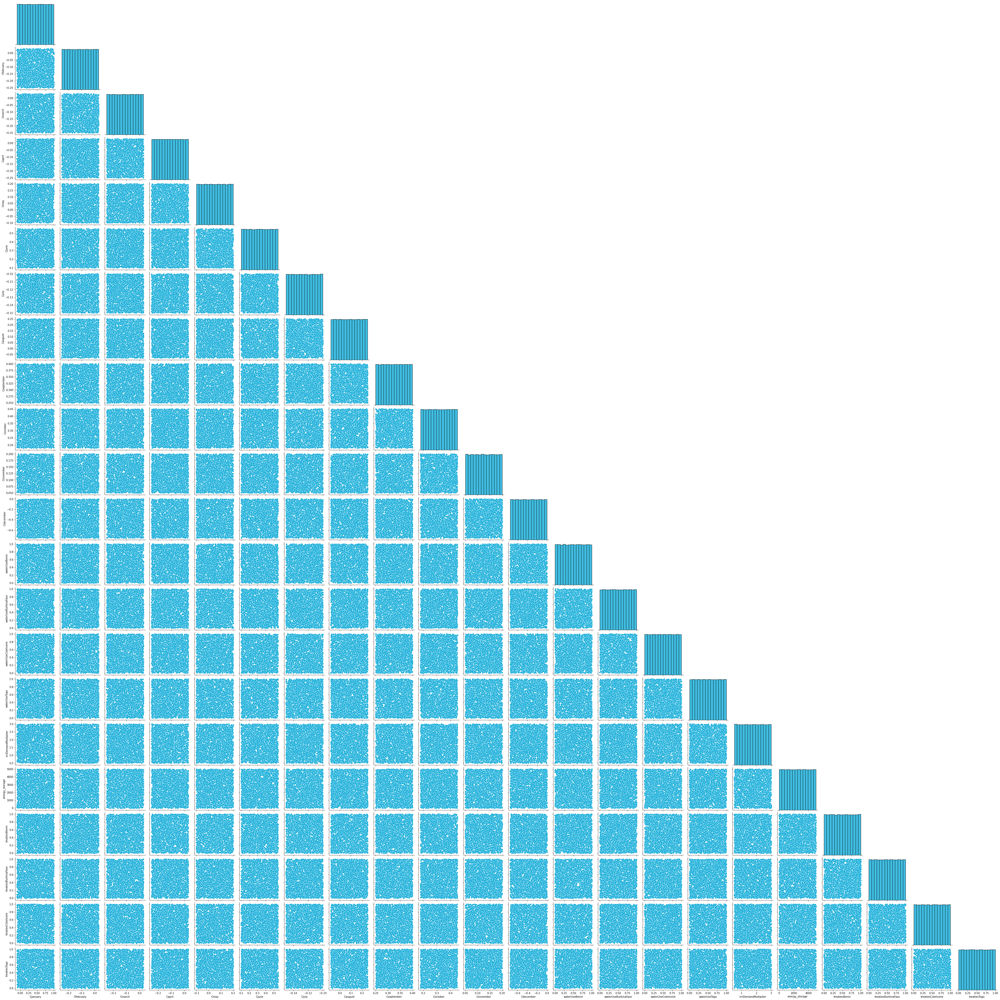

In [29]:
import seaborn as sns
unique_scenarios = experiments[experiments['model'] == 'ReleasePol0Set50x20'].iloc[:,0:-3]
pairplot  = sns.pairplot(unique_scenarios, plot_kws={'facecolors':'#00A6D6'}, diag_kws={'color':'#00A6D6'}, corner=True)
fig = pairplot.figure.get_figure()
fig.savefig('./figures/experiment_space.png', dpi=300)  

In [3]:
# unique_scenarios = experiments[experiments['model'] == 'ReleasePol0Set50x20'].iloc[:,0:-3]
# TUBlue = '#00A6D6'
# #figure, axes = plt.subplots(1, 1, figsize=(16,12))

# def plot_gaps(x, y, ax):
#     ax.scatter(x, y, color=TUBlue, s=1)
#     ax.scatter(x, np.tile(y.min(), len(y)), color='#E03C31', s=1)
#     ax.scatter(np.tile(x.min(), len(x)), y, color='#E03C31', s=1)
# #plot_gaps(unique_scenarios[combination[0]], unique_scenarios[combination[1]], ax=axes[0][0])

### All inflow data

In [4]:
all_data = []
for i in range(len(combined)):
    all_data.append(combined['j_hyd_a'][i])

all_data_flat_ak = np.concatenate(np.concatenate(all_data, axis=0),axis=0)

all_data = []
for i in range(len(combined)):
    all_data.append(combined['j_hyd_kp'][i])
    
all_data_flat_kp = np.concatenate(np.concatenate(all_data, axis=0), axis=0)

all_data = []
for i in range(len(combined)):
    all_data.append(combined['j_energy_reliability'][i])
    
all_data_flat_rel= np.concatenate(np.concatenate(all_data, axis=0), axis=0)

all_data = []
for i in range(len(combined)):
    all_data.append(combined['j_irri'][i])
    
all_data_flat_irri= np.concatenate(np.concatenate(all_data, axis=0), axis=0)

all_data = []
for i in range(len(combined)):
    all_data.append(combined['j_env'][i])
    
all_data_flat_env= np.concatenate(all_data, axis=0)

all_data = []
for i in range(len(combined)):
    all_data.append(combined['j_fldcntrl'][i])
    
all_data_flat_flood= np.concatenate(np.concatenate(all_data, axis=0), axis=0)

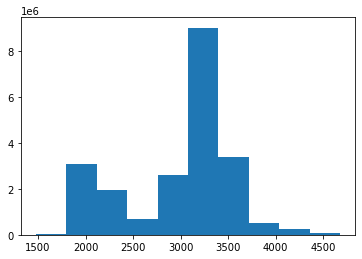

In [5]:
plt.hist(all_data_flat_ak);

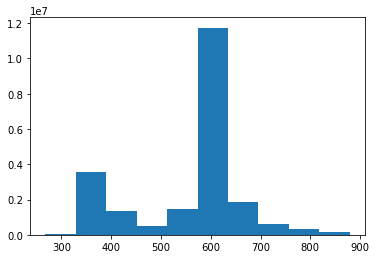

In [6]:
plt.hist(all_data_flat_kp);

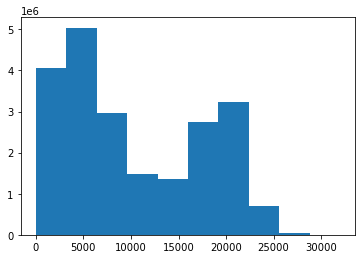

In [7]:
plt.hist(all_data_flat_rel);

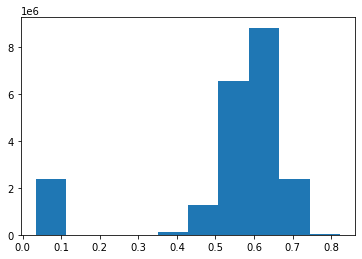

In [8]:
plt.hist(all_data_flat_irri);

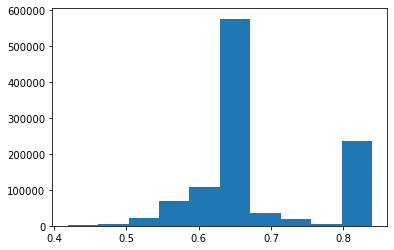

In [9]:
plt.hist(all_data_flat_env);

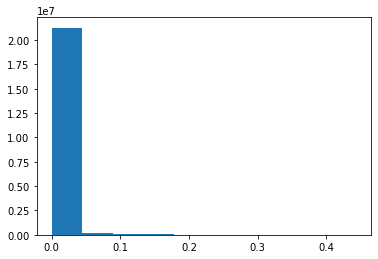

In [10]:
plt.hist(all_data_flat_flood);

## Stochastic hydrology aggregation

In [13]:
#Selection of percentage from all years (50x20=1000 outcome values per metric)
returnT = pd.DataFrame(data=np.zeros(1))
returnT['j_env'] = 1/30 # low is bad
returnT['j_hyd_a'] = 1/20 # low is bad
returnT['j_hyd_kp'] = 1/20 # low is bad
returnT['j_irri'] = 1/30 # low is bad
returnT['j_fldcntrl'] = 1-1/100 #  high is bad
returnT['j_energy_reliability'] = 1-1/10 #High is bad

combined_returnT = combined.copy()
for key in outcomes_df.columns:
    combined_returnT[key] = combined[key].apply(lambda x : np.percentile(x, returnT[key][0]*100))

In [14]:
outcomes_dfT = pd.DataFrame()
for key in outcomes_df.columns:
    outcomes_dfT[key] = combined_returnT[key]

## Parallel axis plots

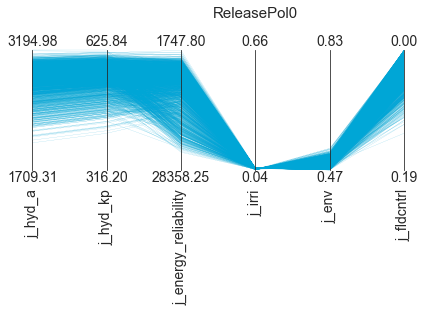

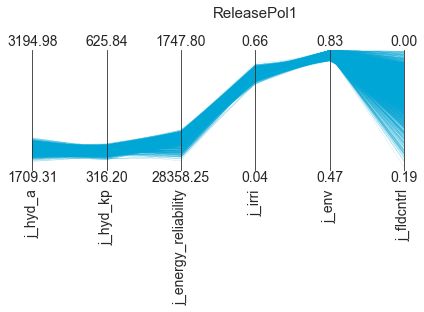

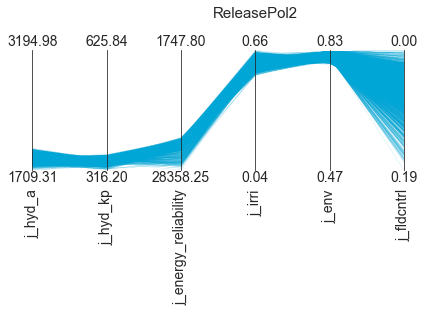

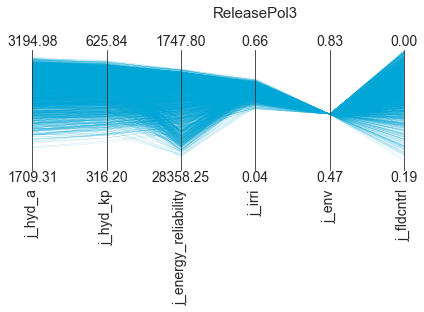

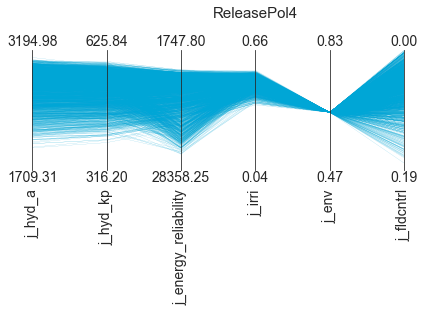

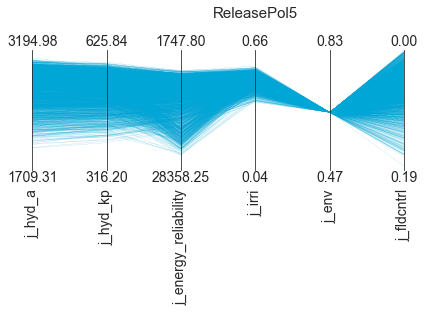

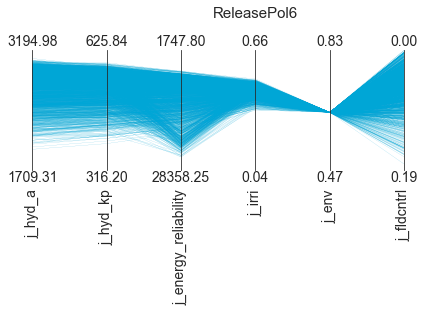

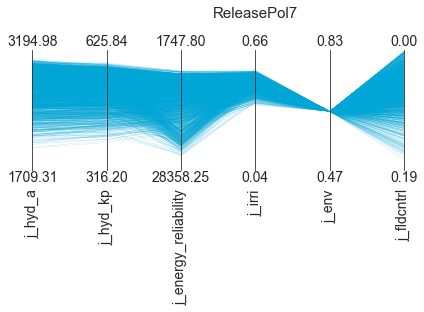

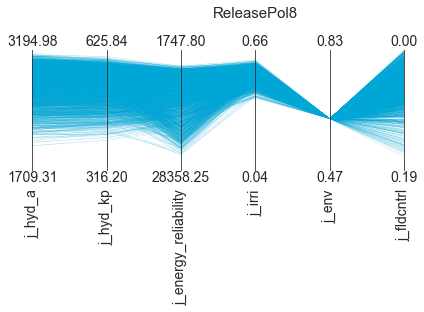

In [9]:
i=0
TUBlue = '#00A6D6'
limits = parcoords.get_limits(outcomes_dfT)
for rbf_policy in np.unique(combined['model']):
    to_plot = combined_returnT[combined_returnT['model']==rbf_policy][outcomes_dfT.columns]
    
    paraxes = parcoords.ParallelAxes(limits)
    paraxes.plot(to_plot, color=TUBlue, label=rbf_policy, linewidth=0.1)
    paraxes.invert_axis('j_fldcntrl')
    paraxes.invert_axis('j_energy_reliability')
    plt.title(str(rbf_policy)[0:11], x=-1, y=1.1, fontdict = {'fontsize' : 15})
    plt.savefig(f'./figures/uncertainty/parax_pol{i}.png', dpi=300)

    i+=1

    plt.show()

In [ ]:
i=0
TUBlue = '#00A6D6'
colors = plt.cm.Set1(np.linspace(0, 1,9))


limits = parcoords.get_limits(outcomes_dfT)
for rbf_policy in np.unique(combined['model']):
    to_plot = combined_returnT[combined_returnT['model']==rbf_policy][outcomes_dfT.columns]
    
    paraxes = parcoords.ParallelAxes(limits)
    paraxes.plot(to_plot, color=colors[i], label=rbf_policy, linewidth=0.1)
    paraxes.invert_axis('j_fldcntrl')
    paraxes.invert_axis('j_energy_reliability')
    plt.title(str(rbf_policy)[0:11], x=-1, y=1.1, fontdict = {'fontsize' : 15})
    plt.savefig(f'./figures/uncertainty/parax_pol{i}_colors.png', dpi=300)

    i+=1

    plt.show()

In [39]:
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 600

In [ ]:
import seaborn
import matplotlib.pyplot as plt

from ema_workbench.analysis import parcoords

all_data = outcomes_dfT
limits = parcoords.get_limits(all_data)
axes = parcoords.ParallelAxes(limits)

colors = plt.cm.Set1(np.linspace(0, 1,9))
i=0
for rbf_policy in np.unique(combined['model']):
    print(rbf_policy)
    to_plot = combined_returnT[combined_returnT['model']==rbf_policy][outcomes_dfT.columns]
    axes.plot(to_plot, color=colors[i], alpha=0.2 - 0.02*i, label=str(rbf_policy)[0:11])
    i+=1

plt.title('Parallel axis plots of release policies in different scenarios', y=1, fontdict = {'fontsize' : 15})    
axes.invert_axis('j_fldcntrl')
axes.invert_axis('j_energy_reliability')
axes.legend()
plt.savefig('./figures/uncertainty/parax_policies_all.png', dpi=300, bbox_extra_artists=(axes.legend(),plt.title('Parallel axis plots of release policies in different scenarios', y=1, fontdict = {'fontsize' : 15})    ))
plt.show()


ReleasePol0Set50x20
ReleasePol1Set50x20
ReleasePol2Set50x20


ReleasePol3Set50x20
ReleasePol4Set50x20
ReleasePol5Set50x20
ReleasePol6Set50x20
ReleasePol7Set50x20
ReleasePol8Set50x20


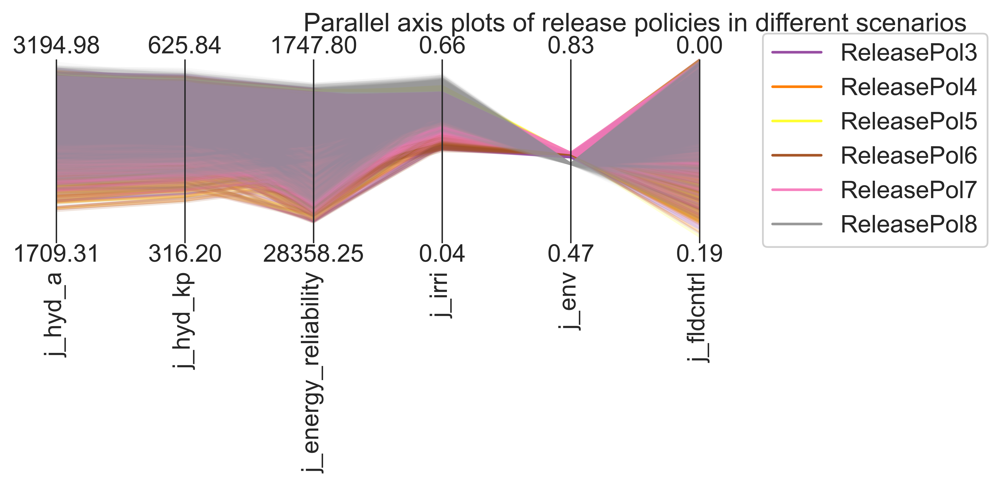

In [41]:
all_data = outcomes_dfT
limits = parcoords.get_limits(all_data)
axes = parcoords.ParallelAxes(limits)

colors = plt.cm.Set1(np.linspace(0, 1,9))
i=0
for rbf_policy in np.unique(combined['model'])[3:9]:
    print(rbf_policy)
    to_plot = combined_returnT[combined_returnT['model']==rbf_policy][outcomes_dfT.columns]
    axes.plot(to_plot, color=colors[i+3], alpha=0.3 - 0.05*i, label=str(rbf_policy)[0:11])
    i+=1

plt.title('Parallel axis plots of release policies in different scenarios', y=1, fontdict = {'fontsize' : 15})    
axes.invert_axis('j_fldcntrl')
axes.invert_axis('j_energy_reliability')
axes.legend()
plt.savefig('./figures/uncertainty/parax_policies_middle.png', dpi=300, bbox_extra_artists=(axes.legend(),plt.title('Parallel axis plots of release policies in different scenarios', y=1, fontdict = {'fontsize' : 15})    ))
plt.show()


## Histograms / cdfs

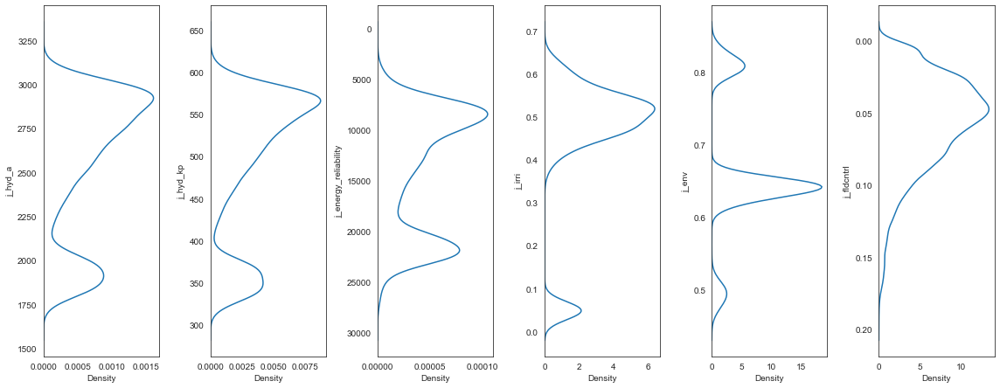

In [15]:
import seaborn as sns 

# all_data = outcomes_df
# limits = parcoords.get_limits(all_data)
# axes = parcoords.ParallelAxes(limits)

# colors=['red', 'black', 'blue', 'orange', 'pink']

# for i in range(len(combined.model.unique())): 
#     axes.plot(outcomes_df.iloc[len(combined.scenario.unique())*i: len(combined.scenario.unique())*(i+1)], color=colors[i], alpha=1, label=combined.model.unique()[i])


figure, axes = plt.subplots(1, 1, figsize=(16,12))

#ax0 = plt.subplot2grid(shape=(2, 5), loc=(0, 0), colspan=5)
ax1 = plt.subplot2grid(shape=(2, 6), loc=(0, 0), colspan=1)
ax2 = plt.subplot2grid(shape=(2, 6), loc=(0, 1), colspan=1)
ax3 = plt.subplot2grid(shape=(2, 6), loc=(0, 2), colspan=1)
ax4 = plt.subplot2grid(shape=(2, 6), loc=(0, 3), colspan=1)
ax5 = plt.subplot2grid(shape=(2, 6), loc=(0, 4), colspan=1)
ax6 = plt.subplot2grid(shape=(2, 6), loc=(0, 5), colspan=1)




sns.kdeplot(y=outcomes_dfT['j_hyd_a'], ax=ax1)
sns.kdeplot(y=outcomes_dfT['j_hyd_kp'],  ax=ax2)
sns.kdeplot(y=outcomes_dfT['j_energy_reliability'],  ax=ax3)
sns.kdeplot(y=outcomes_dfT['j_irri'], ax=ax4)
sns.kdeplot(y=outcomes_dfT['j_env'],  ax=ax5)
sns.kdeplot(y=outcomes_dfT['j_fldcntrl'], ax=ax6)

ax3.invert_yaxis()
ax6.invert_yaxis()

plt.tight_layout()
plt.savefig('./figures/uncertainty/kde_outcomes_total.png', dpi=300)

In [1]:
figure, axes = plt.subplots(1, 1, figsize=(16,12))
colors = plt.cm.Set1(np.linspace(0, 1,9))


ax1 = plt.subplot2grid(shape=(2, 6), loc=(0, 0), colspan=1)
ax2 = plt.subplot2grid(shape=(2, 6), loc=(0, 1), colspan=1)
ax3 = plt.subplot2grid(shape=(2, 6), loc=(0, 2), colspan=1)
ax4 = plt.subplot2grid(shape=(2, 6), loc=(0, 3), colspan=1)
ax5 = plt.subplot2grid(shape=(2, 6), loc=(0, 4), colspan=1)
ax6 = plt.subplot2grid(shape=(2, 6), loc=(0, 5), colspan=1)

i=0
for policy in combined.model.unique():
    sns.kdeplot(y=combined_returnT[combined_returnT.model==policy]['j_hyd_a'], ax=ax1, label=policy[0:11] , color=colors[i])
    i+=1
    
i=0
for policy in combined.model.unique():
    sns.kdeplot(y=combined_returnT[combined_returnT.model==policy]['j_hyd_kp'], ax=ax2, label=policy[0:11], color=colors[i])
    i+=1

i=0   
for policy in combined.model.unique():
    sns.kdeplot(y=combined_returnT[combined_returnT.model==policy]['j_energy_reliability'], ax=ax3, label=policy[0:11], color=colors[i])
    i+=1
    
i=0
for policy in combined.model.unique():
    sns.kdeplot(y=combined_returnT[combined_returnT.model==policy]['j_irri'], ax=ax4, label=policy[0:11], color=colors[i])
    i+=1
    
i=0
for policy in combined.model.unique():
    if len(np.unique(combined_returnT[combined_returnT.model==policy]['j_env'])) > 1:
        sns.kdeplot(y=combined_returnT[combined_returnT.model==policy]['j_env'], ax=ax5, label=policy[0:11], color=colors[i])
    else:
        sns.histplot(y=combined_returnT[combined_returnT.model==policy]['j_env'], ax=ax5, label=policy[0:11], stat='density', bins=100,  color=colors[i])
        print(policy)
    i+=1
    
i=0    
for policy in combined.model.unique():
    sns.kdeplot(y=combined_returnT[combined_returnT.model==policy]['j_fldcntrl'], ax=ax6, label=policy[0:11], color=colors[i])
    i+=1

ax3.invert_yaxis()
ax6.invert_yaxis()
ax4.set_xlim(0,30)
plt.title('Density plots of policy performance under scenarios')    
plt.legend()
plt.tight_layout()
plt.savefig('./figures/uncertainty/kde_outcomes_policies.png', dpi=300)

NameError: name 'plt' is not defined

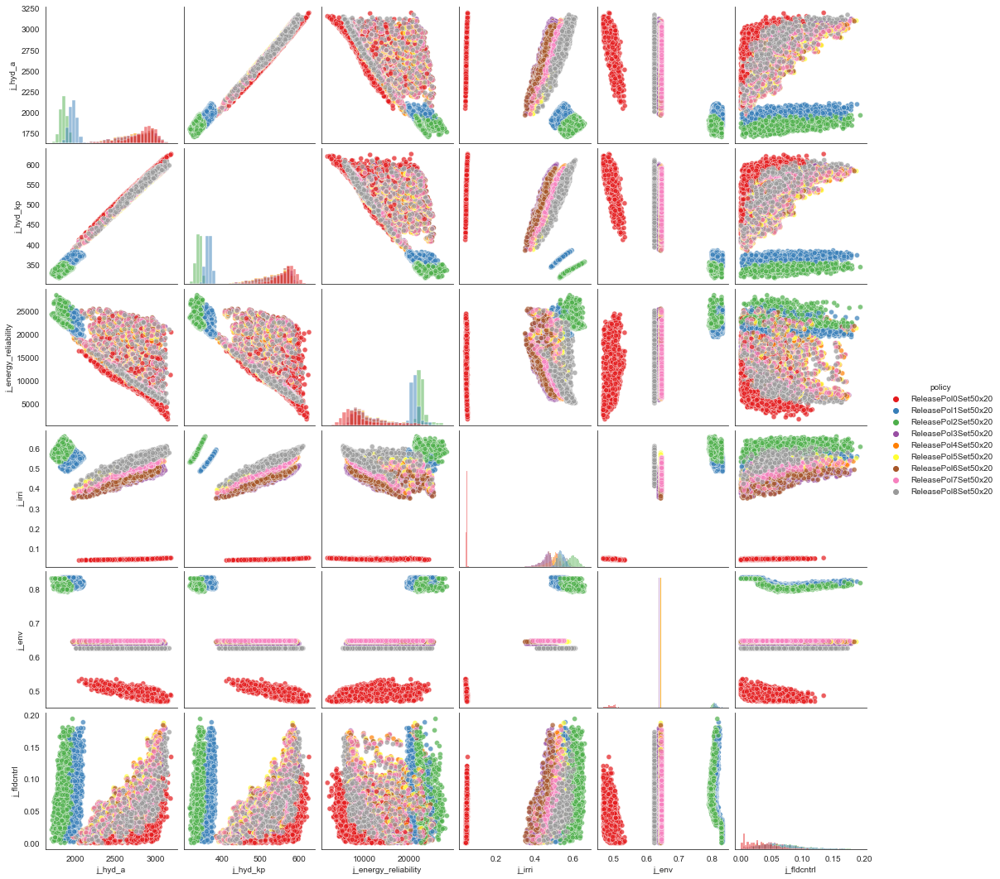

In [33]:
outcome_policy = outcomes_dfT
outcome_policy['policy'] = combined['model']
outcome_policy['j_env']

for policy in combined.model.unique()[0:1]:
    sns.pairplot(outcomes_dfT, corner=False, hue='policy', diag_kind='hist', kind='scatter', plot_kws={'alpha': 0.7}, palette=colors)
    
plt.savefig('./figures/uncertainty/pairplot.png', dpi=300)